# End to end multi-class Dog Breed Classification  
---
This notebook builds end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub

## 1. Problem
Identifying the breed of the dog given an image of a dog. 
## 2. Data
The data we are using is from Kaggle's Dog Breed Identification Competition.  

https://www.kaggle.com/c/dog-breed-identification/data 

## 3. Evaluation

A file with Prediction Probabilities of different classes is used for evaluation.

Submissions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation 

## 4. Features

* We are dealing with images - Unstructured Data
* There are 120 different breeds of dogs. This implies that there are 120 classes for the target label.
* There are 10000+ images in training set (with labels)
* There are 10000+ images in test set (without labels)


In [1]:
# One time shell command to unzip dataset
# !unzip "drive/MyDrive/Dog_Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog_Vision/"

## Get our workspace ready

In [2]:
# import tensorflow into colab
import tensorflow as tf;
print("Tensorflow Version:",tf.__version__)
# import tensorflow hub
import tensorflow_hub as hub;
print("TF Hub version", hub.__version__)

Tensorflow Version: 2.5.0
TF Hub version 0.12.0


In [3]:
# Check for GPU availability
print("GPU", "available YES!!!" if tf.config.list_physical_devices('GPU') else "not available :(")

GPU available YES!!!


## Getting our data ready! (Turning it into Tensors)

With all machine learning models, our data has to be in numerical format. That's what we will be doing first. Turning our images into tensors (numerical representation).

Let's start by accessing the data and checking out the labels.

In [4]:
# Chekout labels of the data

import pandas as pd;

labels_csv = pd.read_csv("drive/MyDrive/Dog_Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     9f16e8d651033662302441057134f4ec  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


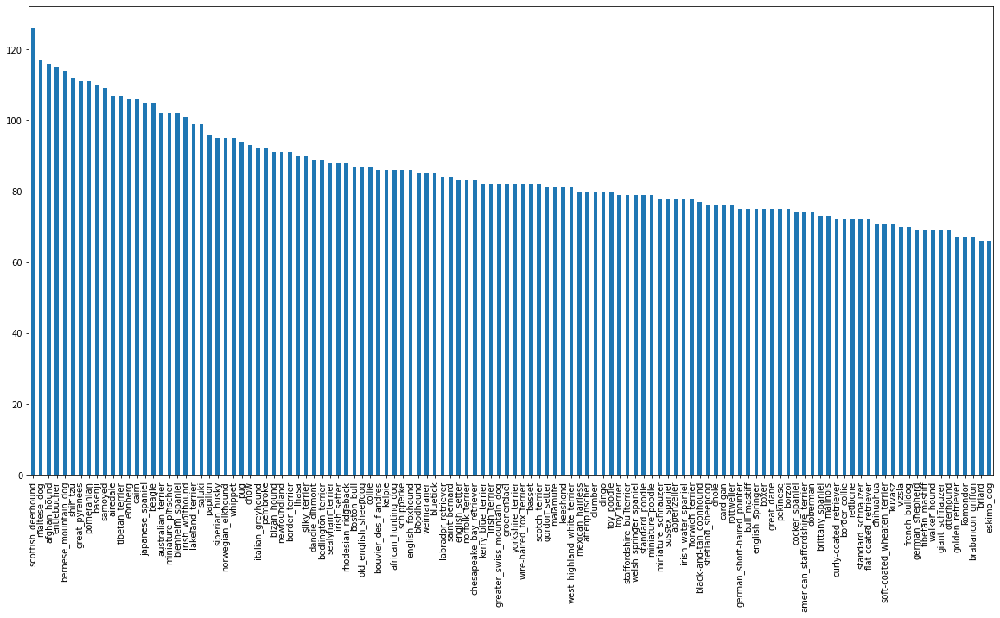

In [5]:
# How many images of each breed are there?
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv.breed.value_counts().median()

82.0

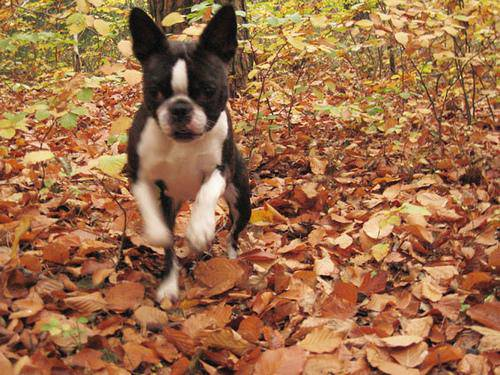

In [7]:
# Let's view an image
from IPython.display import Image
Image(f"drive/MyDrive/Dog_Vision/train/{labels_csv.id[0]}.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathnames from image ids
filenames=[f"drive/MyDrive/Dog_Vision/train/{fname}.jpg" for fname in labels_csv.id]
filenames[:10]

['drive/MyDrive/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
import os;
if len(os.listdir("drive/MyDrive/Dog_Vision/train/"))==len(filenames):
  print("Filenames match actual number of files in training database! Proceed!")
else:
  print("There is a mismatch. Please check the data")

Filenames match actual number of files in training database! Proceed!


Since we now have our training image filepaths in a list, let us prepare our labels

In [11]:
import numpy as np
labels = labels_csv['breed'];
labels=np.array(labels);
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
len(labels)

10222

In [13]:
if (len(labels)==len(filenames)):
  print("number of labels matches number of filename!");
else:
  print("Label-filename mismatch! Please check directories!!")

number of labels matches number of filename!


In [14]:
#Find unique label values
unique_breeds=np.unique(labels);
len(unique_breeds)

120

In [15]:
# turn a single label into array of booleans

labels[0]==unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
# turn every label into array of booleans

boolean_labels = [label == unique_breeds for label in labels];
np.shape(boolean_labels)

(10222, 120)

### Creating our own validation dataset

Since Kaggle dataset does not come with validation dataset we will create our own validation dataset by spliting the training dataset.

In [17]:
# Setup X and y variables
X = filenames;
y = boolean_labels;

In [18]:
len(filenames)

10222

#### We are going to start with 1000 images and increase as per requirement

In [19]:
# Set number of images to use for experimenting

NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10222,step:100} 


In [20]:
# Let us split our data into train and validation set
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42);

np.shape(X_train), np.shape(y_train), np.shape(X_val), np.shape(y_val)

((800,), (800, 120), (200,), (200, 120))

In [21]:
X_train[:2],y_train[:2]

(['drive/MyDrive/Dog_Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog_Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (Turn images into tensors)

To preprocess images into tensors, we create a function which

1. Takes image filepath as input
2. Use tensorflow to read filepath and store it in variable `image`
3. Turn our `image` into tensors
4. Normalize our `image`. Convert colour channel values from 0-255 to 0-1
5. resize the `image` into a standard size to shape of (224,224)
6. return modified `image`



In [22]:
# convert image into numpy array

from matplotlib.pyplot import imread
image =imread(X_train[0])
image.shape

(375, 500, 3)

In [23]:
tf.constant(image)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[ 10,  11,  15],
        [ 14,  15,  19],
        [ 17,  18,  22],
        ...,
        [ 16,  12,   1],
        [ 24,  20,   9],
        [ 28,  24,  13]],

       [[ 12,  13,  15],
        [ 11,  12,  14],
        [ 10,  11,  13],
        ...,
        [ 22,  18,  15],
        [ 20,  16,  13],
        [ 26,  22,  19]],

       [[ 13,  14,  16],
        [  9,  10,  12],
        [  6,   7,   9],
        ...,
        [ 17,  12,  18],
        [  3,   0,   4],
        [  3,   0,   4]],

       ...,

       [[104,  90,  61],
        [119, 105,  76],
        [142, 127,  98],
        ...,
        [164, 147, 129],
        [160, 143, 125],
        [161, 144, 126]],

       [[111,  97,  68],
        [125, 111,  82],
        [131, 116,  87],
        ...,
        [147, 130, 112],
        [150, 133, 115],
        [154, 137, 119]],

       [[120, 106,  77],
        [147, 133, 104],
        [133, 118,  89],
        ...,
        [130, 113,  9

Now we have seen what an image looks like in a tensor form.

Let's make a function to preprocess them.


1. Takes image filepath as input
2. Use tensorflow to read filepath and store it in variable `image`
3. Turn our `image` into tensors
4. Normalize our `image`. Convert colour channel values from 0-255 to 0-1
5. resize the `image` into a standard size to shape of (224,224)
6. return modified `image`

In [24]:
# Define a standard image size
IMAGE_SIZE=224;

# Create a function for preprocessing images

def process_image(image_path,img_size=IMAGE_SIZE):
  '''
  Takes image filepath and turns it into a tensor
  '''
  # Read an image file
  image = tf.io.read_file(image_path);
  
  # turn the jpeg image into tensor with 3 colour channels (Red, Green, Blue - RGB)
  image = tf.image.decode_jpeg(image,channels=3);

  # Normalize colour channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32);

  # resize image 224 x 224
  image = tf.image.resize(image, [img_size,img_size])

  return image




## Turning our data into batches

Why turn our data into batches? 

Let's say you try to process all 10000+ images in one go ... they all might not fit into memory 

That is why we use 32 images batch size at a time. You can manually adjust batch size if required.

In order to use tensorflow effectively, use data in the form of tensor tuples in the form of `(image,label)`

In [25]:
#Create a simple function to return (image,label) tuple
def get_image_label(image_path, label):
  '''Takes image pathname and associated label, processes the image and returns the tuple (image, label)
  '''
  image=process_image(image_path)
  return image,label

In [26]:
get_image_label(X[42],tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

After turning our data into tuple of Tensors (image, label), let us turn all of our data (X,y) into batches

In [27]:
# Define batch size 
BATCH_SIZE=32;

# Create a function to turn data into batches
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Create batches corresponding to dataset (training/validation/test)
  Shuffles data if it is training data and does not shuffle for validation data
  Function Inputs:
  X --> Training data (images)
  y --> target (optional for test data )
  batch_size --> size of batch (default=32)

  if validation dataset, set valid_data argument to True
  if test dataset, set test_data argument to True
  

  returns dataset in the form of batches
  '''

  # if data is test dataset,we do not have labels
  if test_data:
    print("Creating test data batches...");
    img_data=tf.data.Dataset.from_tensor_slices(tf.constant(X));
    data_batch=img_data.map(process_image).batch(BATCH_SIZE);

  # if we use validation dataset
  elif valid_data:
    print("Creating validation data batches...")
    img_data=tf.data.Dataset.from_tensor_slices((tf.constant(X),    # filepath
                                                 tf.constant(y)));  # labels
    data_batch=img_data.map(get_image_label).batch(BATCH_SIZE);

  else:
    print("Creating training data batches...")
    # turn filepath and labels into tensor slices
    img_data=tf.data.Dataset.from_tensor_slices((tf.constant(X),    # filepath
                                                 tf.constant(y)));  # labels

    # Shuffle pathnames and labels,. Shuffling better processing image is faster
    img_data = img_data.shuffle(buffer_size=len(X));
    # create (image, label) tuple from (path,label) tuple and create batches of size 32
    data_batch=img_data.map(get_image_label).batch(BATCH_SIZE);
  
  return data_batch

In [28]:
# Create training and validation batches

train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [29]:
print(train_data.element_spec)
print(val_data.element_spec)

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))


## Visualizing Data Batches

In [30]:
import matplotlib.pyplot as plt

# create a function for viewing images in a databatch

def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  fig, ax =plt.subplots(5,5,figsize=(15,15))
  
  for i in range(5):
    for j in range(5):
      ax[i][j].imshow(images[i*5+j])
      ax[i][j].set_title(unique_breeds[labels[i*5+j].argmax()])
      ax[i][j].set_xticks([])
      ax[i][j].set_yticks([])
      
  


In [31]:
train_images,train_labels = next(train_data.as_numpy_iterator())

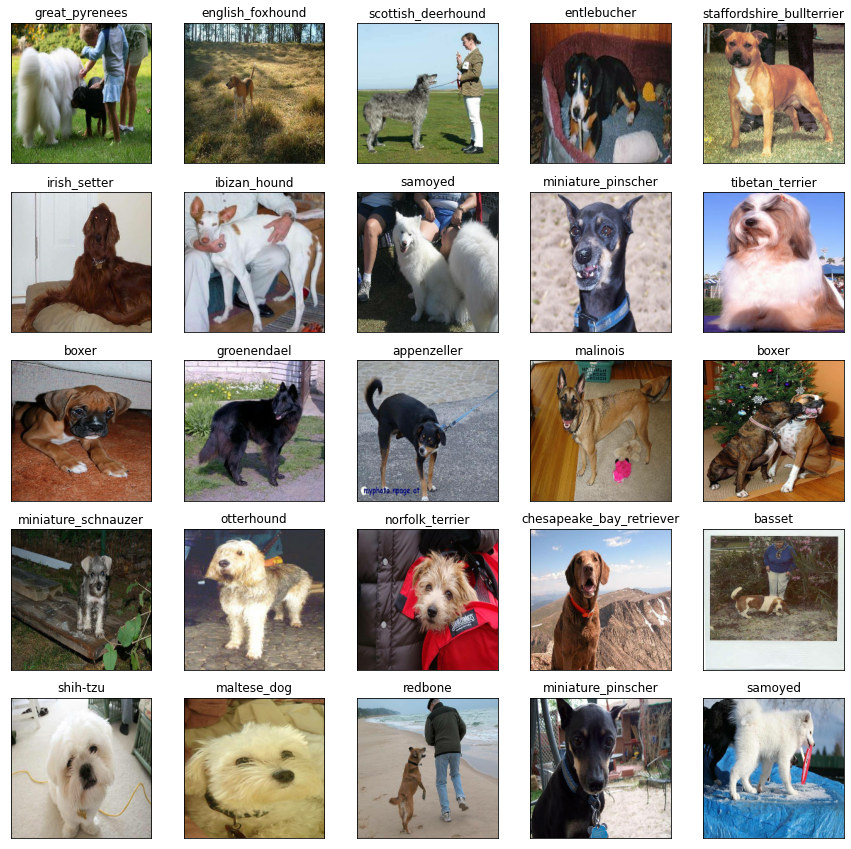

In [32]:
show_25_images(train_images,train_labels)

In [33]:
# after visualizing our training dataset let us visualize validation dataset
val_images,val_labels = next(val_data.as_numpy_iterator())

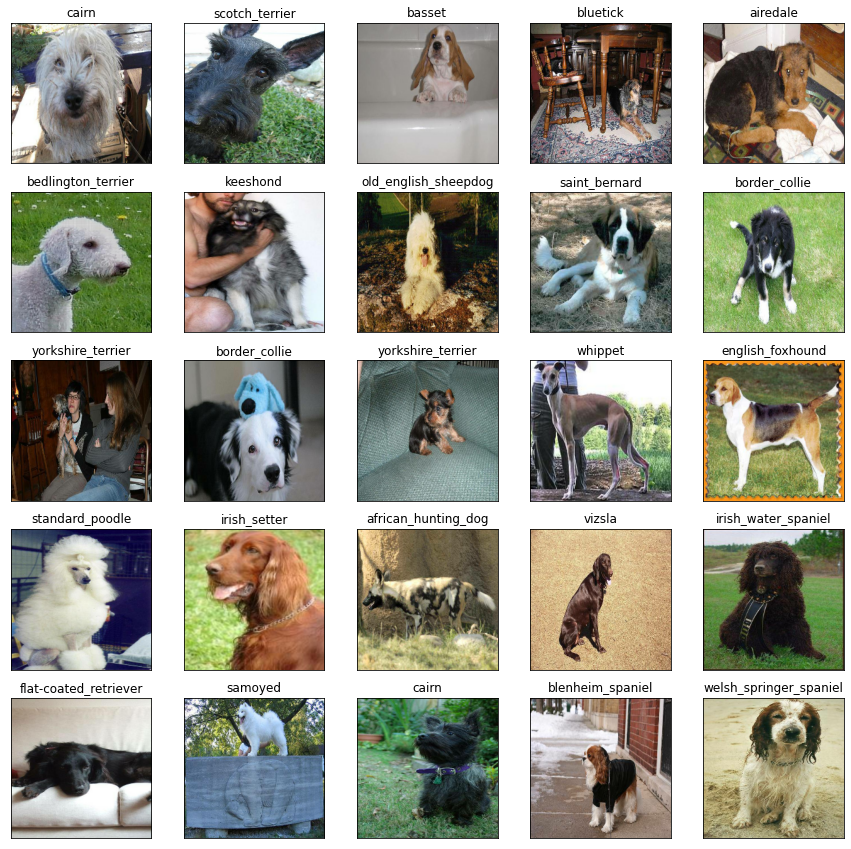

In [34]:
show_25_images(val_images,val_labels)

## Building a model

Before we build a model, there are a few things we need to define. 

1. Input Shape (Image shape in the form of tensors)
2. Output Shape (Image labels in the form of tensors)
3. url of the model we want to use from TensorflowHub
https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/classification/5 



In [35]:
INPUT_SHAPE =  [None,IMAGE_SIZE,IMAGE_SIZE,3];
OUTPUT_SHAPE = len(unique_breeds);
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/classification/5" ;


Now that we have our input, output and TF hub model url ready....
Let's put then together
We create a function which-
* takes input shape, output shape and model url as input
* defines layers in Keras model in sequential fashion
* compiles the model (says how it should be evaluated)
* builds the model
* returns the model

In [36]:
# Create a function which builds a Keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL),# Layer1 Input Layer
                              tf.keras.layers.Dense(units=OUTPUT_SHAPE, # Layer 2 - Output Layer
                              activation='softmax')]) # Activation function
  
  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']  );

  #build the model
  model.build(INPUT_SHAPE)

  return model;

In [37]:
model=create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              2555993   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 2,676,233
Trainable params: 120,240
Non-trainable params: 2,555,993
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions used by a model during training to save progress, check progress or stop training early if model stops improving.

We will create two callbacks-

1. Ternsorboard - Track progress of training
2. Early stopping of training - Stop if model trains for too long to stop overfitting

To setup tensorboard callback-

1. Load tensorboard notebook extension
2. Creat tensorboard callback to save logs to directory and pass it to model's `fit()` function
3. Visualise our model's training logs using `%tensorboard` magic function

In [38]:
# Load ternsorboard notebook extension
%load_ext tensorboard

In [39]:
import datetime;
# Create function to build tensorboard callback
def create_tensorboard_callback():
  # create log directory in Dog Vision project to store log files
  logdir = os.path.join("drive/MyDrive/Dog_Vision/logs",
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))# Make it so that logs get tracked everytime we run DogVision proje
  return tf.keras.callbacks.TensorBoard(logdir);

### Early stopping callback
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping 

In [40]:
def early_stopping_callback():
  return tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)

## training a model (on subset of data)

Our first model is only going to train on 1000 images to ensure that it works

In [41]:
NUM_EPOCHS=100 #@param{type:'slider',min:10,max:100,step:10}

In [42]:
# check if we are still running on a gpu
print("GPU", "available YES!!!" if tf.config.list_physical_devices('GPU') else "not available :(")

GPU available YES!!!


Creat a function to train model
* create a model using `create_model()`
* Setup TensorBoard callback by calling `create_tensorboard_callback()`
* Use `fit()` function to fit the training data to the model, `early_stop_callback()` if training takes too long without improvement in accuracy
* return the model


In [46]:
# build a function to train the model
def train_model():
  '''
  Trains a given model and returns the trained version of the model
  '''
  # Create model
  model=create_model()

  # Tensorboard callback everytime we train the model
  tensorboard_logs=create_tensorboard_callback()

  # early stopping callback when training takes too much time to avoid overfitting
  early_stopping=early_stopping_callback()


  # Fit model to the data passing it the callbacks we create
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq=1, callbacks=[tensorboard_logs, early_stopping])

  # return fitted model
  return model

In [47]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 120s 3s/step - loss: 5.1856 - accuracy: 0.0475 - val_loss: 4.0602 - val_accuracy: 0.1250
Epoch 2/100
25/25 [==============================] - 3s 117ms/step - loss: 1.9762 - accuracy: 0.5400 - val_loss: 2.9303 - val_accuracy: 0.3250
Epoch 3/100
25/25 [==============================] - 3s 112ms/step - loss: 0.6882 - accuracy: 0.9000 - val_loss: 2.4765 - val_accuracy: 0.4200
Epoch 4/100
25/25 [==============================] - 3s 113ms/step - loss: 0.2694 - accuracy: 0.9900 - val_loss: 2.3017 - val_accuracy: 0.4350
Epoch 5/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1387 - accuracy: 1.0000 - val_loss: 2.2471 - val_accuracy: 0.4500
Epoch 6/100
25/25 [==============================] - 3s 112ms/step - loss: 0.0918 - accuracy: 1.0000 - val_loss: 2.2134 - val_accuracy: 0.4650
Epoch 7/100
25/25 [==============================] - 3s 117ms/step - loss: 0.0690 - accuracy: 1.0000 - val_loss: 2.1929 - val_accuracy: 0.4600


## Our model is overfitting (performing 100% on training data but not performing well on validation dataset)

Some ways to avoid overfitting-
* Reduce the network’s capacity by removing layers or reducing the number of elements in the hidden layers
* Apply regularization, which comes down to adding a cost to the loss function for large weights
* Use Dropout layers, which will randomly remove certain features by setting them to zero

## Checking Tensorboard logs

In [48]:
%tensorboard --logdir drive/MyDrive/Dog_Vision/logs/

Output hidden; open in https://colab.research.google.com to view.

In [49]:
# Make prediction on trained model
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 79ms/step


array([[8.83622677e-04, 1.39858562e-03, 2.61096266e-05, ...,
        1.42931152e-04, 1.74643751e-03, 2.87943380e-03],
       [4.70160507e-03, 1.40971155e-04, 1.31472275e-01, ...,
        9.93997892e-05, 4.83341515e-04, 4.35555325e-04],
       [1.60271720e-05, 8.32093938e-04, 1.23082515e-04, ...,
        1.34753075e-03, 2.89318959e-05, 5.01276782e-06],
       ...,
       [4.95151973e-08, 2.75826301e-06, 5.28833743e-06, ...,
        1.65353001e-07, 1.45249999e-07, 4.83254858e-08],
       [2.83727958e-03, 2.34573221e-04, 2.22135332e-05, ...,
        1.22442478e-04, 2.96676852e-04, 2.88890551e-05],
       [1.05198333e-05, 7.81976851e-05, 1.00930614e-04, ...,
        8.42139125e-04, 4.81881463e-04, 1.09057670e-04]], dtype=float32)

In [50]:
predictions.shape

(200, 120)

In [51]:
np.apply_along_axis(lambda x:unique_breeds[x],axis=0,arr=np.argmax(predictions,axis=1))==np.apply_along_axis(lambda x:unique_breeds[x],axis=0,arr=np.argmax(y_val,axis=1))

array([False,  True,  True,  True,  True,  True,  True,  True,  True,
       False, False, False, False,  True,  True, False,  True,  True,
       False, False, False,  True,  True,  True,  True, False,  True,
       False,  True, False,  True,  True, False, False, False, False,
        True,  True, False,  True, False, False,  True,  True, False,
        True,  True, False, False, False, False, False,  True,  True,
       False, False,  True, False, False,  True,  True, False, False,
       False, False, False,  True, False,  True, False,  True, False,
       False,  True,  True,  True, False,  True,  True,  True,  True,
       False,  True, False,  True, False, False,  True,  True, False,
        True,  True, False, False, False,  True, False,  True, False,
       False, False,  True, False, False,  True,  True, False,  True,
        True, False, False,  True,  True, False,  True,  True, False,
       False,  True, False,  True, False, False, False,  True, False,
       False, False,

In [52]:
# Turn prediction probabilities into respective labels
def get_pred_labels(prediction_probabilities):
  '''
  Turns array of prediction probabilities into labels
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

In [58]:
# create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batched dataset of images, labels and returns a separate array of images and labels
  '''
  images=[];
  labels=[];
  # loop through unbatch data

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image);
    labels.append(unique_breeds [np.argmax(label)]);
  return images,labels

val_images,val_labels = unbatchify(val_data)

## Visualizing model predictions

In [70]:
def plot_pred(prediction_probabilities,labels, images, n=1):
  '''
  View Prediction, Ground Truth and image for sample n
  '''
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]

  # Get prediction label
  pred_label=get_pred_labels(pred_prob);

  # plot image and remove ticks
  plt.imshow(image);
  plt.xticks([]);
  plt.yticks([]);

  if(pred_label==true_label):
    color='green';
  else:
    color='red';


  plt.title(f'{pred_label},{np.max(pred_prob)*100:2.0f}%,{ true_label }',color=color)


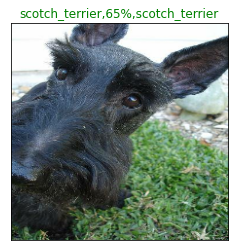

In [93]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images)

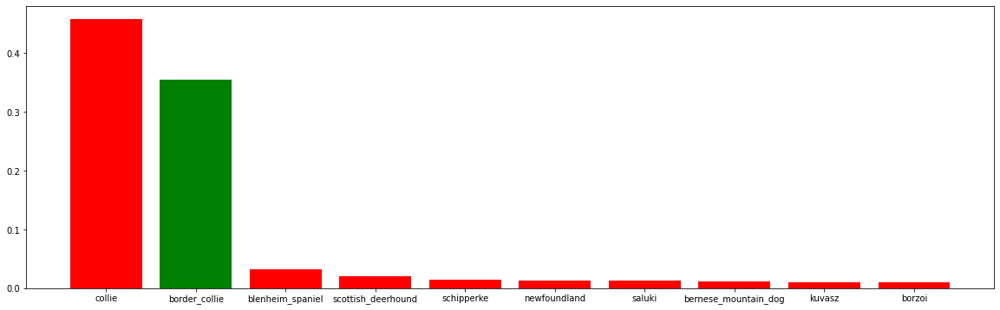

In [164]:
# Let us now visualize our model's top 10 predictions

def pred_top_10(prediction_probabilities,labels, images, n=1):
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]

  breed_matching=unique_breeds[ np.argsort(pred_prob)[-1:-11:-1]]==true_label;
  colors=[];
  for iter in breed_matching:
    if(iter):
      colors.append('green');
    else:
      colors.append('red')
  plt.figure(figsize=(20,6))
  plt.bar(unique_breeds[ np.argsort(pred_prob)[-1:-11:-1]],np.sort(pred_prob)[-1:-11:-1],color=colors)

  
pred_top_10(prediction_probabilities=predictions,labels=val_labels,images=val_images, n=9)


### Create a confusion Matrix

In [177]:
def create_confusion_matrix(val_labels,predictions):
  '''
  Prepare a confusion matrix between true label and predicted label
  '''
  pred_labels=[];
  for iter in predictions:
    pred_labels.append(get_pred_labels(iter))
  
  conf_matrix=np.zeros((len(unique_breeds),len(unique_breeds)))
  for i in range(len(val_labels)):
    for x in range(len(unique_breeds)):
      for y in range(len(unique_breeds)):
        if(val_labels[i]==unique_breeds[x] and pred_labels[i]==unique_breeds[y]):
          conf_matrix[x][y] = conf_matrix[x][y] + 1;
  
  return pd.DataFrame(conf_matrix)
    

In [178]:
create_confusion_matrix(val_labels,predictions)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0
116,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
117,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
118,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


## Saving and reloading a trained model

In [179]:
def save_model(model,suffix=None):
  '''
  Saves a model in a models directory and appends suffix (string) to model name
  '''
  # Create a model directory
  modeldir=os.path.join('drive/MyDrive/Dog_Vision/models',
                        datetime.datetime.now.strftime('%Y%m%d-%H%M%s'))
  modelpath = modeldir+'-'+suffix+'.h5';
  print(f'Saving model to {modelpath} ...')
  model.save(modelpath)
  return modelpath;

In [180]:
def load_model(model_path):
  '''
  Loads saved model from specified filepath
  '''
  model = tf.keras.models.load_model(model_path,custom_objects={'KerasLayer':hub.KerasLayer}) 
  return model


In [182]:
''' Save our model trained on 1000 images
 Can uncomment the following lines to save and load model
 '''
 # save_model(model,suffix='1000images_mobilenetv3_Adams');

 # loaded_1000_image_model = load_model(<model_path>);

 # model.evaluate(val_data);
 # loaded_1000_image_model.evaluate(val_data);    #Should display same response

' Save our model trained on 1000 images\n Can uncomment the following lines to save and load model\n '

## Training big dog model (On full data)

In [183]:
len(X),len(y)

(10222, 10222)

In [184]:
# create data batch (with full dataset)
full_data = create_data_batches(X,y)

Creating training data batches...


In [185]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [186]:
# create model for full mode
full_model = create_model();
full_model_tensorboard = create_tensorboard_callback();
full_model_earlystopping =  tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3);

## Running this cell might take a while (30 mins) because GPU hs to reload all images into memory

In [188]:
# fit full model to full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_earlystopping])

Epoch 1/100
320/320 [==============================] - 904s 3s/step - loss: 1.9767 - accuracy: 0.5170
Epoch 2/100
320/320 [==============================] - 29s 92ms/step - loss: 0.7140 - accuracy: 0.7926
Epoch 3/100
320/320 [==============================] - 30s 92ms/step - loss: 0.4271 - accuracy: 0.8791
Epoch 4/100
320/320 [==============================] - 29s 92ms/step - loss: 0.2708 - accuracy: 0.9334
Epoch 5/100
320/320 [==============================] - 29s 91ms/step - loss: 0.1777 - accuracy: 0.9642
Epoch 6/100
320/320 [==============================] - 29s 91ms/step - loss: 0.1210 - accuracy: 0.9821
Epoch 7/100
320/320 [==============================] - 29s 91ms/step - loss: 0.0867 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 29s 91ms/step - loss: 0.0646 - accuracy: 0.9958
Epoch 9/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0511 - accuracy: 0.9977
Epoch 10/100
320/320 [==============================] - 29s 90ms/step - lo

In [189]:
# save_model(full_model, suffix='full-image-set_mobilev2_Adam');
# loaded_full_model=load_model(<model_path>)

## Making predictions on test dataset

since our model has been trained on images in the form of tensor batches, we need to feed test data into the model for prediction in same format

We had created `create_data_batches()` earlier for this purpose

In [190]:
# load test image filename
test_path = 'drive/MyDrive/Dog_Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_data = create_data_batches(test_filenames,test_data=True);

Creating test data batches...


In [191]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

## Predictions on test data takes fairly long time

In [192]:
# Make predictions on test data batch using full model
test_predictions = full_model.predict(test_data, verbose=1);

324/324 [==============================] - 975s 3s/step


In [193]:
# Save predictions to csv file for access later
np.savetxt('drive/MyDrive/Dog_Vision/preds_array.csv',test_predictions,delimiter=',')

In [194]:
# load predictions
load_test_predictions=np.loadtxt('drive/MyDrive/Dog_Vision/preds_array.csv',delimiter=',')

In [197]:
test_predictions[:10]

array([[3.2137072e-05, 8.7995804e-06, 8.9242417e-07, ..., 1.3141981e-09,
        5.1224247e-09, 1.7114782e-07],
       [1.0316762e-11, 1.3120051e-11, 3.4781323e-08, ..., 3.8267722e-11,
        4.0515755e-09, 1.0755578e-11],
       [6.4487669e-09, 7.1850586e-08, 1.0392334e-06, ..., 2.0712769e-10,
        1.5313599e-09, 1.3760301e-07],
       ...,
       [3.1286218e-10, 5.9270619e-08, 2.7558639e-10, ..., 2.2102351e-09,
        1.3697021e-08, 4.6244493e-09],
       [2.0017062e-08, 5.2636996e-04, 2.8786511e-07, ..., 2.2188385e-07,
        7.3103329e-10, 3.7895979e-06],
       [3.4922067e-12, 1.4919569e-09, 1.5938820e-09, ..., 6.4758606e-05,
        9.8966673e-08, 4.1676082e-10]], dtype=float32)

In [198]:
test_predictions.shape

(10357, 120)

In [199]:
load_test_predictions.shape

(10357, 120)

### Prepare test dataset predictions for submission in Kaggle

Expected Submission format
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation 

In [214]:
# Create pandas DataFrame
id_dataframe=pd.DataFrame({'id':pd.Series([os.path.splitext(path)[0] for path in os.listdir(test_path)])});
prediction_dataframe=pd.DataFrame(test_predictions,columns=unique_breeds);
preds_df=pd.concat([id_dataframe,prediction_dataframe],axis=1);
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7be7b911a4cba9fdfa4105ec4776370,3.213707e-05,8.799580e-06,8.924242e-07,6.345083e-09,1.339041e-08,7.447534e-11,2.751216e-07,1.227735e-09,2.846637e-08,1.487046e-10,4.490650e-10,8.952784e-08,9.290172e-09,1.119035e-08,4.706502e-10,2.511476e-09,2.901199e-08,3.548708e-07,3.854346e-07,1.321710e-08,7.088675e-06,1.153149e-11,2.915792e-06,1.320668e-05,1.500698e-10,2.051081e-10,1.339776e-04,1.605243e-07,9.651812e-10,5.265161e-11,2.303240e-10,6.573975e-07,7.312770e-07,3.024551e-09,3.786848e-10,2.884515e-07,5.302344e-09,7.387531e-08,5.415785e-07,...,1.496330e-06,1.101006e-05,5.925753e-12,3.873265e-10,1.671732e-08,1.584270e-10,3.091479e-09,2.123518e-08,2.519051e-06,2.529415e-07,8.176182e-10,1.663929e-08,8.497258e-15,1.114903e-09,1.105054e-09,3.996858e-05,9.614923e-01,7.353213e-05,9.738450e-09,7.394030e-08,2.779838e-06,2.683637e-11,2.131707e-08,2.884057e-08,3.952734e-06,7.162363e-10,6.590617e-03,1.210699e-09,6.089133e-10,3.810188e-08,3.453462e-05,6.765329e-09,3.721271e-08,1.436731e-09,2.077634e-11,1.658133e-09,2.295470e-07,1.314198e-09,5.122425e-09,1.711478e-07
1,e7ce78e874945f182a4f5149aa505b09,1.031676e-11,1.312005e-11,3.478132e-08,4.698842e-13,1.481648e-09,5.074390e-11,8.647710e-08,5.333935e-07,1.239770e-10,4.255680e-12,2.135907e-08,1.487906e-09,8.550164e-10,8.196326e-13,9.164440e-13,3.739637e-11,2.648996e-06,5.273044e-13,1.553422e-10,6.114616e-07,4.228187e-09,5.273345e-13,8.282015e-10,8.865084e-12,3.674510e-11,1.004559e-11,1.121988e-08,1.416554e-07,6.206674e-09,8.440955e-09,2.661359e-12,7.547069e-12,1.277082e-13,1.479490e-09,1.174179e-05,1.517207e-08,1.172451e-07,7.099305e-07,1.045449e-08,...,3.001486e-07,2.715296e-07,5.366484e-12,2.462739e-13,8.482008e-10,7.740342e-14,5.193103e-10,4.798575e-11,5.219092e-09,3.393549e-10,3.108464e-10,8.847070e-10,4.615010e-14,1.021317e-11,3.483717e-11,1.654147e-03,1.843495e-06,1.912056e-05,3.479134e-12,2.665063e-12,3.368399e-14,4.525164e-09,1.128963e-07,8.437698e-14,9.578654e-06,6.146577e-10,1.701393e-09,7.650523e-08,1.683895e-12,5.461898e-13,1.601315e-10,3.121489e-09,7.001228e-09,5.372127e-12,4.721264e-10,2.344408e-08,4.553936e-09,3.826772e-11,4.051576e-09,1.075558e-11
2,e7dc8cc599049ea9fa2a172c88646c57,6.448767e-09,7.185059e-08,1.039233e-06,7.740173e-09,1.387992e-05,9.976773e-09,1.923469e-09,3.336064e-08,2.777299e-11,5.001637e-07,1.626429e-12,9.006528e-07,1.055722e-09,6.353694e-09,1.614768e-10,1.064027e-08,6.150778e-04,4.358525e-11,4.160773e-08,1.163589e-06,6.597757e-12,2.401217e-09,4.895863e-07,3.304747e-08,1.785646e-06,1.094753e-10,8.815532e-12,1.697821e-09,1.863104e-11,2.512108e-06,2.901497e-09,1.818142e-10,6.909391e-05,2.718657e-06,1.074859e-08,2.001346e-09,9.178859e-09,9.810672e-10,2.742545e-11,...,1.371638e-11,6.437878e-09,6.680963e-10,3.367373e-10,9.979002e-01,2.066447e-06,5.939205e-09,2.447992e-06,1.183717e-07,1.509972e-10,1.504417e-11,2.179833e-09,3.443628e-09,4.502093e-09,4.499673e-09,4.532940e-09,8.251

## Save dataframe to csv file for submission

In [216]:
preds_df.to_csv('drive/MyDrive/Dog_Vision/full_model_prediction_submission_1_mobilenetV3.csv',index=False)

** ** ** ** ** ** ** ** ___ THE END __ ** ** ** ** ** ** ** **